In [ ]:
#Importing Libraries
import tensorflow as tf
import numpy as np
import pandas as pd
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
import matplotlib.patches as mpatches
import sys
import warnings
import os
from google.colab import files
import pickle
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

In [ ]:
gpu_devices = tf.config.experimental.list_physical_devices("GPU")
for device in gpu_devices:
    tf.config.experimental.set_memory_growth(device, True)

In [ ]:
# enables music21 to render images of musical notes
print('installing lilypond...')
!apt-get install lilypond > /dev/null

# converts midi files to wav files into order to play them
print('installing fluidsynth...')
!apt-get install fluidsynth > /dev/null
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2

print('installing musescore...')
!apt install musescore3 > /dev/null

print('done!')

installing lilypond...
Extracting templates from packages: 100%
installing fluidsynth...
Extracting templates from packages: 100%
installing musescore...


done!


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import auth
auth.authenticate_user()

In [ ]:
#Loading the list of chopin's midi files as stream
filepath = "/content/drive/MyDrive/ClassicalMusic/chopin/"
#Getting midi files
all_midis= []
for i in os.listdir(filepath):
    if i.endswith(".mid"):
        tr = filepath+i
        midi_ut = converter.parse(tr)
        midi = midi_ut.stripTies()
        all_midis.append(midi)


In [ ]:
all_midis = all_midis[:5]

In [ ]:
def show(music):
  display(Image(str(music.write('lily.png'))))

def play(music):
  filename = music.write('mid')
  !fluidsynth -ni font.sf2 $filename -F $filename\.wav -r 16000 > /dev/null
  display(Audio(str(filename) + '.wav'))

def download(music):
  filename = music.write('mid')
  !fluidsynth -ni font.sf2 $filename -F $filename\.wav -r 16000 > /dev/null
  return (str(filename) + '.wav')

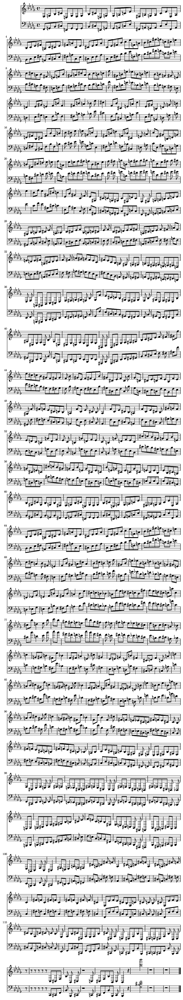

In [ ]:
show(all_midis[1])

In [ ]:
play(all_midis[1])

In [ ]:
def split_part(midis):
  all_midis_parts = []

  for midi in midis:
    for i in range(len(midi.parts)):
      all_midis_parts.append(midi.parts[i])

  return all_midis_parts

In [ ]:
all_midi_split = split_part(all_midis)

In [ ]:
len(all_midi_split)

11

In [ ]:
def split_clef(midis_parts):
  treble_clef_midi = []
  bass_clef_midi = []

  for midi in midis_parts:
    for element in midi.flat:

      clef_name = None

      if isinstance(element, music21.clef.Clef):
        clef_name = str(element.name)

        if clef_name  == 'treble':
          treble_clef_midi.append(midi)

        elif clef_name == 'bass':
          bass_clef_midi.append(midi)

  return treble_clef_midi, bass_clef_midi


In [ ]:
treble_midis, bass_midis = split_clef(all_midi_split)

In [ ]:
treble_midis

[<music21.stream.Part 0x7a8ff5d07070>,
 <music21.stream.Part 0x7a8ff5033490>,
 <music21.stream.Part 0x7a8ff4b96e90>,
 <music21.stream.Part 0x7a8ff21ea2c0>,
 <music21.stream.Part 0x7a8fef3a9600>]

In [ ]:
bass_midis

[<music21.stream.Part 0x7a8ff5a55180>,
 <music21.stream.Part 0x7a8ff50300d0>,
 <music21.stream.Part 0x7a8ff4b97340>,
 <music21.stream.Part 0x7a8ff27e7d90>,
 <music21.stream.Part 0x7a8fef3a9d80>,
 <music21.stream.Part 0x7a8fef271ff0>]

In [ ]:
duplicates = [element for element in bass_midis if element in treble_midis]
print(duplicates)

[]


In [ ]:
def extract_notes_all(midi_clef):

  notes = []
  durations = []
  #types = []
  sequence_num = []

  for midi_part in midi_clef:
    for element in midi_part.flat:
      note_name = None
      duration_name  = None


    #if isinstance(element, music21.key.Key):
    # note_name = str(element.tonic.name) + ':' + str(element.mode)
    #  duration_name = "0.0"

    #elif isinstance(element, music21.meter.TimeSignature):
    #  note_name = str(element.ratioString) + 'TS'
    #  duration_name = "0.0"

      if isinstance(element, music21.chord.Chord):
        note_name = []
        duration_name = []
        for i in element.pitches:
          note_name.append(i.nameWithOctave)
        #note_name = element.pitches[-1].nameWithOctave
        #note_name = element
          #duration_name.append(element.duration.quarterLength)
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Rest):
        note_name = str(element.name)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Note):
        note_name = str(element.nameWithOctave)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      if note_name and duration_name:
        notes.append(note_name)
        durations.append(duration_name)

  return notes, durations

In [ ]:
bass_midis_element = extract_notes_all(bass_midis)
treble_midis_element = extract_notes_all(treble_midis)

In [ ]:
bass_midis_element

(['F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'C#2',
  'G3',
  'B-3',
  'G#3',
  'B3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'C#2',
  'G3',
  'B-3',
  'G#3',
  'B3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'E-2',
  'A3',
  'C4',
  'B-3',
  'E-4',
  'F#3',
  'G#2',
  'G3',
  'B-3',
  'G#3',
  'C#4',
  'F3',
  'rest',
  'G#2',
  'G3',
  'B-3',
  'G#3',
  'C4',
  'E-3',
  'C#3',
  'G3',
  'B-3',
  'G#3',
  'C#4',
  'F3',
  'G#3',
  'F#3',
  'B3',
  'E-3',
  'F#3',
  'F3',
  'B-3',
  'C#3',
  'B-3',
  'B2',
  'B-3',
  'G#3',
  'rest',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3'

In [ ]:
len(bass_midis_element[0])

3963

In [ ]:
len(bass_midis_element[1])

3963

In [ ]:
treble_midis_element

([['C#4', 'F#4', 'B-4'],
  ['F#4', 'C#4', 'B-4'],
  ['C#4', 'B-4', 'F#4'],
  'rest',
  'F4',
  'B4',
  'G#4',
  ['F#4', 'B-4', 'C#4'],
  'rest',
  'C#4',
  ['F#4', 'B-4'],
  ['B-4', 'F#4'],
  'C#4',
  ['B-4', 'F#4'],
  'rest',
  ['B4', 'G#4'],
  ['B-4', 'F#4'],
  'rest',
  ['F4', 'G#4'],
  'rest',
  ['B-4', 'F#4'],
  'rest',
  'F4',
  ['C#5', 'B-4'],
  'rest',
  ['B4', 'G#4'],
  'rest',
  'rest',
  ['G#4', 'C#4'],
  ['C#4', 'F#4', 'B-4'],
  ['B-4', 'C#4', 'C#5'],
  ['B-4', 'F#5', 'F#4'],
  'rest',
  ['C#5', 'F5', 'G#4'],
  ['F#4', 'G#4'],
  'F5',
  'E-5',
  ['F#4', 'G#4'],
  'rest',
  ['F4', 'C#5', 'G#4'],
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'B-3',
  ['F#4', 'B-4', 'C#4'],
  ['C#4', 'F#4', 'B-4'],
  ['F#4', 'B-4'],
  'C#4',
  'rest',
  ['B4', 'F4'],
  'G#4',
  ['F#4', 'C#4', 'B-4'],
  'rest',
  ['C#4', 'B-4'],
  'F#4',
  'rest',
  [

In [ ]:
len(treble_midis_element[0])

4435

In [ ]:
len(treble_midis_element[1])

4435

In [ ]:
bass_df = pd.DataFrame(bass_midis_element).T
bass_df.columns = ['music_element', 'duration']
bass_df

,music_element,duration
0,F#2,0.5
1,F3,0.5
2,G#3,0.5
3,F#3,0.5
4,B-3,0.5
...,...,...
3958,E1,2.0
3959,E2,4.0
3960,rest,1.0
3961,B1,3.0


In [ ]:
treble_df = pd.DataFrame(treble_midis_element).T
treble_df.columns = ['music_element', 'duration']
treble_df

,music_element,duration
0,"[C#4, F#4, B-4]",3.0
1,"[F#4, C#4, B-4]",3.0
2,"[C#4, B-4, F#4]",3.0
3,rest,3.0
4,F4,3.0
...,...,...
4430,E4,0.25
4431,E4,1.0
4432,E4,0.75
4433,E4,0.25


In [ ]:
chords_list_tr = []
for i in treble_df['music_element']:
  if type(i) == list:
    chords_list_tr.append(i)

In [ ]:
chords_list_tr

[['C#4', 'F#4', 'B-4'],
 ['F#4', 'C#4', 'B-4'],
 ['C#4', 'B-4', 'F#4'],
 ['F#4', 'B-4', 'C#4'],
 ['F#4', 'B-4'],
 ['B-4', 'F#4'],
 ['B-4', 'F#4'],
 ['B4', 'G#4'],
 ['B-4', 'F#4'],
 ['F4', 'G#4'],
 ['B-4', 'F#4'],
 ['C#5', 'B-4'],
 ['B4', 'G#4'],
 ['G#4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['B-4', 'C#4', 'C#5'],
 ['B-4', 'F#5', 'F#4'],
 ['C#5', 'F5', 'G#4'],
 ['F#4', 'G#4'],
 ['F#4', 'G#4'],
 ['F4', 'C#5', 'G#4'],
 ['F#4', 'B-4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['F#4', 'B-4'],
 ['B4', 'F4'],
 ['F#4', 'C#4', 'B-4'],
 ['C#4', 'B-4'],
 ['C#4', 'B-4', 'F#4'],
 ['F#4', 'B-4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['F#4', 'B-4', 'C#4'],
 ['B-4', 'F#4', 'C#4'],
 ['F#4', 'B-4'],
 ['G#4', 'B4'],
 ['F#4', 'B-4'],
 ['G#4', 'F4'],
 ['B-4', 'F#4'],
 ['B-4', 'C#5'],
 ['G#4', 'B4'],
 ['C#4', 'G#4'],
 ['E4', 'C#4', 'B-4'],
 ['B-4', 'E4'],
 ['B-4', 'E4', 'C#5'],
 ['E4', 'E-5', 'B-4'],
 ['C#5', 'E4', 'B-4'],
 ['G#4', 'B4', 'E-4'],
 ['C#4', 'G4', 'B-4'],
 ['G#4', 'B3', 'B4'],
 ['G#4', 'B3'],
 ['B-4', 'C#4'],
 [

In [ ]:
chords_list_bs = []
for i in bass_df['music_element']:
  if type(i) == list:
    chords_list_bs.append(i)

In [ ]:
chords_list_bs

[['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'E-4'],
 ['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'C#4'],
 ['E-3', 'C4'],
 ['E-3', 'B-3'],
 ['G#2', 'B-3'],
 ['G#2', 'G#3'],
 ['G#3', 'G#2'],
 ['C#3', 'G#3'],
 ['E-3', 'G#3'],
 ['C#3', 'G#3'],
 ['G#2', 'G#3'],
 ['C#3', 'G#3'],
 ['E-3', 'G#3'],
 ['C#3', 'G#3'],
 ['F#3', 'G#3'],
 ['F3', 'G#3'],
 ['G#2', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'C#4'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'B3'],
 ['C#3', 'B-3'],
 ['C#3', 'G#3'],
 ['F#2', 'G#3'],
 ['F#2', 'F#3'],
 ['F#3', 'F#2'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['E-3', 'F#3'],
 ['F#3', 'E-3'],
 ['E-3', 'F#3'],
 ['E-3', 'F#3'],
 ['C#3', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#3', 'B2'],
 ['B2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['C#3', 'F#3'],
 ['E-3', 'F#3'],
 ['F#3', 'E-3'],
 ['B2', 'F#3'],
 ['B2', 'F

In [ ]:
unique_chords_tr = list(np.unique(np.array(chords_list_tr, dtype = object)))

In [ ]:
chords_dict_tr = dict()
for i in range(len((unique_chords_tr))):
  if type(unique_chords_tr[i]) == list:
    chords_dict_tr[str('CH') + str(i)] =unique_chords_tr[i]

In [ ]:
chords_dict_tr

{'CH0': ['A4', 'E-4', 'C5'],
 'CH1': ['A4', 'E-4', 'E-5'],
 'CH2': ['A4', 'F5', 'E-4'],
 'CH3': ['A5', 'G#5'],
 'CH4': ['B-3', 'A4'],
 'CH5': ['B-3', 'B-4'],
 'CH6': ['B-3', 'C#4', 'B-4'],
 'CH7': ['B-3', 'D4', 'B-4'],
 'CH8': ['B-3', 'E-4', 'B-4'],
 'CH9': ['B-3', 'E4', 'B-4'],
 'CH10': ['B-3', 'F#4'],
 'CH11': ['B-3', 'F4', 'B-4'],
 'CH12': ['B-3', 'G4', 'B-4'],
 'CH13': ['B-4', 'B-3'],
 'CH14': ['B-4', 'B-3', 'C#4'],
 'CH15': ['B-4', 'B-5'],
 'CH16': ['B-4', 'B-5', 'G5'],
 'CH17': ['B-4', 'C#4'],
 'CH18': ['B-4', 'C#4', 'C#5'],
 'CH19': ['B-4', 'C#5'],
 'CH20': ['B-4', 'C#5', 'E4'],
 'CH21': ['B-4', 'E4'],
 'CH22': ['B-4', 'E4', 'C#5'],
 'CH23': ['B-4', 'F#4'],
 'CH24': ['B-4', 'F#4', 'C#4'],
 'CH25': ['B-4', 'F#5'],
 'CH26': ['B-4', 'F#5', 'F#4'],
 'CH27': ['B-4', 'G5'],
 'CH28': ['B-5', 'A5'],
 'CH29': ['B-5', 'B-4'],
 'CH30': ['B-5', 'C#5', 'G5'],
 'CH31': ['B-5', 'F#5'],
 'CH32': ['B-5', 'G5'],
 'CH33': ['B-5', 'G5', 'B-4'],
 'CH34': ['B-5', 'G5', 'C#5'],
 'CH35': ['B-6', 'B-5']

In [ ]:
unique_chords_bs = list(np.unique(np.array(chords_list_bs, dtype = object)))

In [ ]:
chords_dict_bs = dict()
for i in range(len((unique_chords_bs))):
  if type(unique_chords_bs[i]) == list:
    chords_dict_bs[str('CH') + str(i)] =unique_chords_bs[i]

In [ ]:
chords_dict_bs

{'CH0': ['A1', 'A2'],
 'CH1': ['A3', 'C#4'],
 'CH2': ['A3', 'C4', 'E3'],
 'CH3': ['A3', 'E-3'],
 'CH4': ['A4', 'C4', 'A3'],
 'CH5': ['A4', 'F#4', 'E-4', 'C4'],
 'CH6': ['B-1', 'B-2'],
 'CH7': ['B-1', 'B1'],
 'CH8': ['B-1', 'B1', 'C#2', 'B1', 'C#2'],
 'CH9': ['B-2', 'B-3'],
 'CH10': ['B-2', 'D3', 'G#3'],
 'CH11': ['B-2', 'E-3', 'G3'],
 'CH12': ['B-2', 'F#3'],
 'CH13': ['B-2', 'F3'],
 'CH14': ['B-2', 'F3', 'C#4'],
 'CH15': ['B-2', 'F3', 'G#3'],
 'CH16': ['B-2', 'G#3'],
 'CH17': ['B-2', 'G3'],
 'CH18': ['B-3', 'B-2'],
 'CH19': ['B-3', 'C#3'],
 'CH20': ['B-3', 'C#4'],
 'CH21': ['B-3', 'D4'],
 'CH22': ['B-3', 'E-4'],
 'CH23': ['B-3', 'F#3', 'C#3'],
 'CH24': ['B-3', 'F3', 'C#3', 'C#4'],
 'CH25': ['B-3', 'G3'],
 'CH26': ['B-3', 'G4', 'B-4'],
 'CH27': ['B-4', 'F#4', 'C#4'],
 'CH28': ['B-5', 'G5', 'B-4'],
 'CH29': ['B1', 'B2'],
 'CH30': ['B1', 'C#2', 'B1', 'C#2', 'B1'],
 'CH31': ['B2', 'F#3'],
 'CH32': ['B2', 'G#3'],
 'CH33': ['B3', 'D4', 'F#3'],
 'CH34': ['B3', 'E-4', 'F4', 'G#4'],
 'CH35': ['

In [ ]:
unique_duration_tr = list(np.unique(np.array(treble_df['duration'])))

In [ ]:
duration_dict_tr = dict()
for i in range(len((unique_duration_tr))):
    duration_dict_tr[str('DR') + str(i)] =unique_duration_tr[i]

In [ ]:
duration_dict_tr

{'DR0': 0.08333333333333333,
 'DR1': 0.16666666666666666,
 'DR2': 0.25,
 'DR3': 0.3333333333333333,
 'DR4': 0.4166666666666667,
 'DR5': 0.5,
 'DR6': 0.5833333333333334,
 'DR7': 0.6666666666666666,
 'DR8': 0.75,
 'DR9': 1.0,
 'DR10': 1.25,
 'DR11': 1.3333333333333333,
 'DR12': 1.5,
 'DR13': 2.0,
 'DR14': 2.25,
 'DR15': 2.5,
 'DR16': 2.6666666666666665,
 'DR17': 2.75,
 'DR18': 3.0,
 'DR19': 3.5,
 'DR20': 4.0,
 'DR21': 5.25,
 'DR22': 5.5,
 'DR23': 5.75,
 'DR24': 6.0}

In [ ]:
unique_duration_bs = list(np.unique(np.array(bass_df['duration'])))

In [ ]:
duration_dict_bs = dict()
for i in range(len((unique_duration_bs))):
    duration_dict_bs[str('DR') + str(i)] =unique_duration_bs[i]

In [ ]:
duration_dict_bs

{'DR0': 0.08333333333333333,
 'DR1': 0.16666666666666666,
 'DR2': 0.25,
 'DR3': 0.3333333333333333,
 'DR4': 0.5,
 'DR5': 0.5833333333333334,
 'DR6': 0.6666666666666666,
 'DR7': 0.75,
 'DR8': 1.0,
 'DR9': 1.25,
 'DR10': 1.5,
 'DR11': 1.6666666666666667,
 'DR12': 2.0,
 'DR13': 2.3333333333333335,
 'DR14': 2.5,
 'DR15': 2.6666666666666665,
 'DR16': 3.0,
 'DR17': 3.3333333333333335,
 'DR18': 4.0,
 'DR19': 6.0}

In [ ]:
for chord_str, chord_note_lst in chords_dict_tr.items():
  treble_df['music_element'] = treble_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

for chord_str, chord_note_lst in chords_dict_bs.items():
  bass_df['music_element'] = bass_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

In [ ]:
for duration_str, duration_lst in duration_dict_tr.items():
  treble_df['duration'] = treble_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

for duration_str, duration_lst in duration_dict_bs.items():
  bass_df['duration'] = bass_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

In [ ]:
treble_df

,music_element,duration
0,CH46,DR18
1,CH97,DR18
2,CH44,DR18
3,rest,DR18
4,F4,DR18
...,...,...
4430,E4,DR2
4431,E4,DR9
4432,E4,DR8
4433,E4,DR2


In [ ]:
treble_df['note_duration'] = treble_df['music_element'].astype(str) +"_"+ treble_df['duration'].astype(str)

In [ ]:
treble_df

,music_element,duration,note_duration
0,CH46,DR18,CH46_DR18
1,CH97,DR18,CH97_DR18
2,CH44,DR18,CH44_DR18
3,rest,DR18,rest_DR18
4,F4,DR18,F4_DR18
...,...,...,...
4430,E4,DR2,E4_DR2
4431,E4,DR9,E4_DR9
4432,E4,DR8,E4_DR8
4433,E4,DR2,E4_DR2


In [ ]:
bass_df['note_duration'] = bass_df['music_element'].astype(str) +"_"+ bass_df['duration'].astype(str)

In [ ]:
bass_df

,music_element,duration,note_duration
0,F#2,DR4,F#2_DR4
1,F3,DR4,F3_DR4
2,G#3,DR4,G#3_DR4
3,F#3,DR4,F#3_DR4
4,B-3,DR4,B-3_DR4
...,...,...,...
3958,E1,DR12,E1_DR12
3959,E2,DR18,E2_DR18
3960,rest,DR8,rest_DR8
3961,B1,DR16,B1_DR16


In [ ]:
label_encoder_tr = preprocessing.LabelEncoder()

label_encoder_tr.fit_transform(treble_df['note_duration'])
treble_df['note_duration']= label_encoder_tr.transform(treble_df['note_duration'])

label_encoder_bs = preprocessing.LabelEncoder()

label_encoder_bs.fit_transform(bass_df['note_duration'])
bass_df['note_duration']= label_encoder_bs.transform(bass_df['note_duration'])

In [ ]:
treble_df

,music_element,duration,note_duration
0,CH46,DR18,215
1,CH97,DR18,283
2,CH44,DR18,211
3,rest,DR18,424
4,F4,DR18,361
...,...,...,...
4430,E4,DR2,323
4431,E4,DR9,328
4432,E4,DR8,327
4433,E4,DR2,323


In [ ]:
bass_df

,music_element,duration,note_duration
0,F#2,DR4,451
1,F3,DR4,472
2,G#3,DR4,491
3,F#3,DR4,457
4,B-3,DR4,29
...,...,...,...
3958,E1,DR12,431
3959,E2,DR18,434
3960,rest,DR8,523
3961,B1,DR16,36


In [ ]:
vocab_size_tr = len(np.unique(treble_df['note_duration']))

In [ ]:
vocab_size_tr

434

In [ ]:
vocab_size_bs = len(np.unique(bass_df['note_duration']))

In [ ]:
vocab_size_bs

525

In [ ]:
train_tr = []
label_tr = []
note_duration_tr = list(treble_df['note_duration'])
sequence_length = 100


for i in range(len(treble_df) - sequence_length):
      in_1 = note_duration_tr[i:i+sequence_length]
      out_1 = note_duration_tr[i+1:i+1+sequence_length]
      train_tr.append(in_1)
      label_tr.append(out_1)


In [ ]:
train_bs = []
label_bs = []
note_duration_bs = list(bass_df['note_duration'])
sequence_length = 100


for i in range(len(bass_df) - sequence_length):
      in_1 = note_duration_bs[i:i+sequence_length]
      out_1 = note_duration_bs[i+1:i+1+sequence_length]
      train_bs.append(in_1)
      label_bs.append(out_1)


In [ ]:
train_tr = np.array(train_tr, float)
label_tr = np.array(label_tr, float)

In [ ]:
train_df_tr = (train_tr, label_tr)

In [ ]:
train_df_tr

(array([[215., 283., 211., ..., 227., 138., 219.],
        [283., 211., 424., ..., 138., 219., 134.],
        [211., 424., 361., ..., 219., 134., 304.],
        ...,
        [319., 425., 415., ..., 308., 323., 328.],
        [425., 415., 401., ..., 323., 328., 327.],
        [415., 401.,  15., ..., 328., 327., 323.]]),
 array([[283., 211., 424., ..., 138., 219., 134.],
        [211., 424., 361., ..., 219., 134., 304.],
        [424., 361.,  48., ..., 134., 304., 132.],
        ...,
        [425., 415., 401., ..., 323., 328., 327.],
        [415., 401.,  15., ..., 328., 327., 323.],
        [401.,  15.,  38., ..., 327., 323., 322.]]))

In [ ]:
train_bs = np.array(train_bs, float)
label_bs = np.array(label_bs, float)

In [ ]:
train_df_bs = (train_bs, label_bs)

In [ ]:
train_df_bs

(array([[451., 472., 491., ..., 517., 451., 472.],
        [472., 491., 457., ..., 451., 472., 491.],
        [491., 457.,  29., ..., 472., 491., 457.],
        ...,
        [ 73., 177., 211., ..., 302., 431., 434.],
        [177., 211.,  73., ..., 431., 434., 523.],
        [211.,  73., 211., ..., 434., 523.,  36.]]),
 array([[472., 491., 457., ..., 451., 472., 491.],
        [491., 457.,  29., ..., 472., 491., 457.],
        [457.,  29.,  58., ..., 491., 457.,  29.],
        ...,
        [177., 211.,  73., ..., 431., 434., 523.],
        [211.,  73., 211., ..., 434., 523.,  36.],
        [ 73., 211., 213., ..., 523.,  36., 431.]]))

# Language Model -  GPT

In [ ]:
import re

In [ ]:
lm_tr = tf.keras.models.load_model('/content/drive/MyDrive/ClassicalMusic/ModelChopin/MugenGPT_tr')
lm_bs = tf.keras.models.load_model('/content/drive/MyDrive/ClassicalMusic/ModelChopin/MugenGPT_bs')

In [ ]:
maxlen = sequence_length

# Music Generated (key:C - tempo:90)

In [ ]:

seed_len = 100
num_note_to_gen = 100

# We get a random sequence from the input
seq_start_at = random.randint(0,len(treble_df['note_duration'])-sequence_length)
start_tokens = treble_df['note_duration'][seq_start_at:seq_start_at + seed_len].tolist()

original = start_tokens.copy()
backup = original.copy()

def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)


def sample_from(logits, k):
    logits, indices = tf.math.top_k(logits, k= k, sorted=True)
    indices = np.asarray(indices).astype("int32")
    preds = np.asarray(logits).astype("float32")
    preds = softmax(preds)
    return np.random.choice(indices, p=preds)


k = 10
tokens_generated_tr = []
num_tokens_generated = 0

while num_tokens_generated <= num_note_to_gen:
    x = start_tokens[-sequence_length:]
    pad_len = maxlen - len(start_tokens)
    sample_index = -1
    if pad_len > 0:
        x = start_tokens + [0] * pad_len
        sample_index = len(start_tokens) - 1

    x = np.array([x])
    y = lm_tr.predict(x)
    sample_token = sample_from(y[0][sample_index], 10)
    tokens_generated_tr.append(sample_token)
    start_tokens.append(sample_token)
    num_tokens_generated = len(tokens_generated_tr)
    print(f"generated {num_tokens_generated} notes")


1/1 [==============================] - 1s 1s/step
generated 1 notes
1/1 [==============================] - 0s 28ms/step
generated 2 notes
1/1 [==============================] - 0s 37ms/step
generated 3 notes
1/1 [==============================] - 0s 30ms/step
generated 4 notes
1/1 [==============================] - 0s 28ms/step
generated 5 notes
1/1 [==============================] - 0s 27ms/step
generated 6 notes
1/1 [==============================] - 0s 28ms/step
generated 7 notes
1/1 [==============================] - 0s 27ms/step
generated 8 notes
1/1 [==============================] - 0s 30ms/step
generated 9 notes
1/1 [==============================] - 0s 29ms/step
generated 10 notes
1/1 [==============================] - 0s 29ms/step
generated 11 notes
1/1 [==============================] - 0s 28ms/step
generated 12 notes
1/1 [==============================] - 0s 28ms/step
generated 13 notes
1/1 [==============================] - 0s 28ms/step
generated 14 notes
1/1 [============

In [ ]:
iv_togen_tr = label_encoder_tr.inverse_transform(tokens_generated_tr)

In [ ]:
pred_note_tr = []
pred_dur_tr = []

for i in iv_togen_tr:
  pred_note_tr.append(re.split('_', i)[0])
  pred_dur_tr.append(re.split('_', i)[1])


In [ ]:
generated_tr_lm = pd.DataFrame(list(zip(pred_note_tr, pred_dur_tr)), columns =['music_element', 'duration'])

In [ ]:

seed_len = 100
num_note_to_gen = 100

# We get a random sequence from the input
seq_start_at = random.randint(0,len(bass_df['note_duration'])-sequence_length)
start_tokens = bass_df['note_duration'][seq_start_at:seq_start_at + seed_len].tolist()

original = start_tokens.copy()
backup = original.copy()

def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)


def sample_from(logits, k):
    logits, indices = tf.math.top_k(logits, k= k, sorted=True)
    indices = np.asarray(indices).astype("int32")
    preds = np.asarray(logits).astype("float32")
    preds = softmax(preds)
    return np.random.choice(indices, p=preds)


k = 10
tokens_generated_bs = []
num_tokens_generated = 0

while num_tokens_generated <= num_note_to_gen:
    x = start_tokens[-sequence_length:]
    pad_len = maxlen - len(start_tokens)
    sample_index = -1
    if pad_len > 0:
        x = start_tokens + [0] * pad_len
        sample_index = len(start_tokens) - 1

    x = np.array([x])
    y = lm_bs.predict(x)
    sample_token = sample_from(y[0][sample_index], 10)
    tokens_generated_bs.append(sample_token)
    start_tokens.append(sample_token)
    num_tokens_generated = len(tokens_generated_bs)
    print(f"generated {num_tokens_generated} notes")


1/1 [==============================] - 1s 795ms/step
generated 1 notes
1/1 [==============================] - 0s 36ms/step
generated 2 notes
1/1 [==============================] - 0s 46ms/step
generated 3 notes
1/1 [==============================] - 0s 41ms/step
generated 4 notes
1/1 [==============================] - 0s 51ms/step
generated 5 notes
1/1 [==============================] - 0s 40ms/step
generated 6 notes
1/1 [==============================] - 0s 38ms/step
generated 7 notes
1/1 [==============================] - 0s 44ms/step
generated 8 notes
1/1 [==============================] - 0s 40ms/step
generated 9 notes
1/1 [==============================] - 0s 43ms/step
generated 10 notes
1/1 [==============================] - 0s 42ms/step
generated 11 notes
1/1 [==============================] - 0s 41ms/step
generated 12 notes
1/1 [==============================] - 0s 39ms/step
generated 13 notes
1/1 [==============================] - 0s 44ms/step
generated 14 notes
1/1 [=========

In [ ]:
iv_togen_bs = label_encoder_bs.inverse_transform(tokens_generated_bs)

In [ ]:
pred_note_bs = []
pred_dur_bs = []

for i in iv_togen_bs:
  pred_note_bs.append(re.split('_', i)[0])
  pred_dur_bs.append(re.split('_', i)[1])


In [ ]:
generated_bs_lm = pd.DataFrame(list(zip(pred_note_bs, pred_dur_bs)), columns =['music_element', 'duration'])

In [ ]:
for element_str, element_lst in chords_dict_tr.items():
  generated_tr_lm['music_element'] = generated_tr_lm['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_tr.items():
  generated_tr_lm['duration'] = generated_tr_lm['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
for element_str, element_lst in chords_dict_bs.items():
  generated_bs_lm['music_element'] = generated_bs_lm['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_bs.items():
  generated_bs_lm['duration'] = generated_bs_lm['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
main_stream = stream.Score(id='mainScore')
stream_part1 = stream.Part(id='Part1')
stream_part2 = stream.Part(id='Part2')
instrument1 = instrument.Piano()
clef1 = clef.TrebleClef()
clef2 = clef.BassClef()
tempos = tm2 = tempo.MetronomeMark(number=90)
keys = key.Key(pitch.Pitch('C'))
time_signature = meter.TimeSignature('4/4')
key_order = ['music_element', 'duration']

In [ ]:
def music_generation_part(stream_part, instrument, clef, tempo, key, time_signature, set_element):

  for i in [instrument, clef, tempo, key, time_signature]:
    stream_part.append(i)

  for notes, durations in zip(set_element[key_order[0]],set_element[key_order[1]]):
    note_name = None

    if type(notes) != list:

      if notes != 'rest':
        note_name = note.Note(notes)
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

      elif notes == 'rest':
        note_name = note.Rest()
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

    elif type(notes) == list:
      note_name = chord.Chord(notes)
      note_name.duration.quarterLength = durations
      stream_part.append(note_name)

  return stream_part

In [ ]:
treble_generation_part_lm = music_generation_part(stream_part1, instrument1, clef1, tempos, keys, time_signature, generated_tr_lm)

In [ ]:
bass_generation_part_lm = music_generation_part(stream_part2, instrument1, clef2, tempos, keys, time_signature, generated_bs_lm)

In [ ]:
def convert_to_float(frac_str):
    try:
        return float(frac_str)
    except ValueError:
        num, denom = frac_str.split('/')
        try:
            leading, num = num.split(' ')
            whole = float(leading)
        except ValueError:
            whole = 0
        frac = float(num) / float(denom)
        return whole - frac if whole < 0 else whole + frac

In [ ]:
for i in bass_generation_part_lm:
  if convert_to_float(i.offset) > convert_to_float(treble_generation_part_lm[-1].offset):
    bass_generation_part_lm.remove(i)

for i in treble_generation_part_lm:
  if convert_to_float(i.offset) > convert_to_float(bass_generation_part_lm[-1].offset):
    treble_generation_part_lm.remove(i)

In [ ]:
def music_generation_main(main_score, stream_parts_list):
  for i in stream_parts_list:
    main_score.insert(0, i)

  return main_score

In [ ]:
music_generated_lm_1 = music_generation_main(main_stream, [treble_generation_part_lm, bass_generation_part_lm])

In [ ]:
music_generated_lm_1.show('text')

{0.0} <music21.stream.Part Part1>
    {0.0} <music21.instrument.Piano 'Piano'>
    {0.0} <music21.clef.TrebleClef>
    {0.0} <music21.tempo.MetronomeMark maestoso Quarter=90>
    {0.0} <music21.key.Key of C major>
    {0.0} <music21.meter.TimeSignature 4/4>
    {0.0} <music21.chord.Chord E-4 G#4>
    {1.0} <music21.note.Note B>
    {1.5} <music21.note.Rest quarter>
    {2.5} <music21.note.Note B>
    {3.0} <music21.chord.Chord E-4 G#4 B3>
    {4.0} <music21.chord.Chord B-4 B-3 C#4>
    {5.0} <music21.chord.Chord E-4 G#4 B3>
    {6.0} <music21.chord.Chord B-3 C#4 B-4>
    {9.0} <music21.chord.Chord B-4 E4>
    {12.0} <music21.note.Rest 5.75ql>
    {17.75} <music21.chord.Chord B-4 E4>
    {20.75} <music21.note.Note B>
    {21.0} <music21.chord.Chord B-4 C#5 E4>
    {24.0} <music21.note.Rest 5.75ql>
    {29.75} <music21.chord.Chord E-5 E4 F#5 B-4>
    {32.75} <music21.note.Note C#>
    {33.0} <music21.chord.Chord F#5 E4 C#5>
    {36.0} <music21.note.Rest dotted-half>
    {39.0} <music21.c

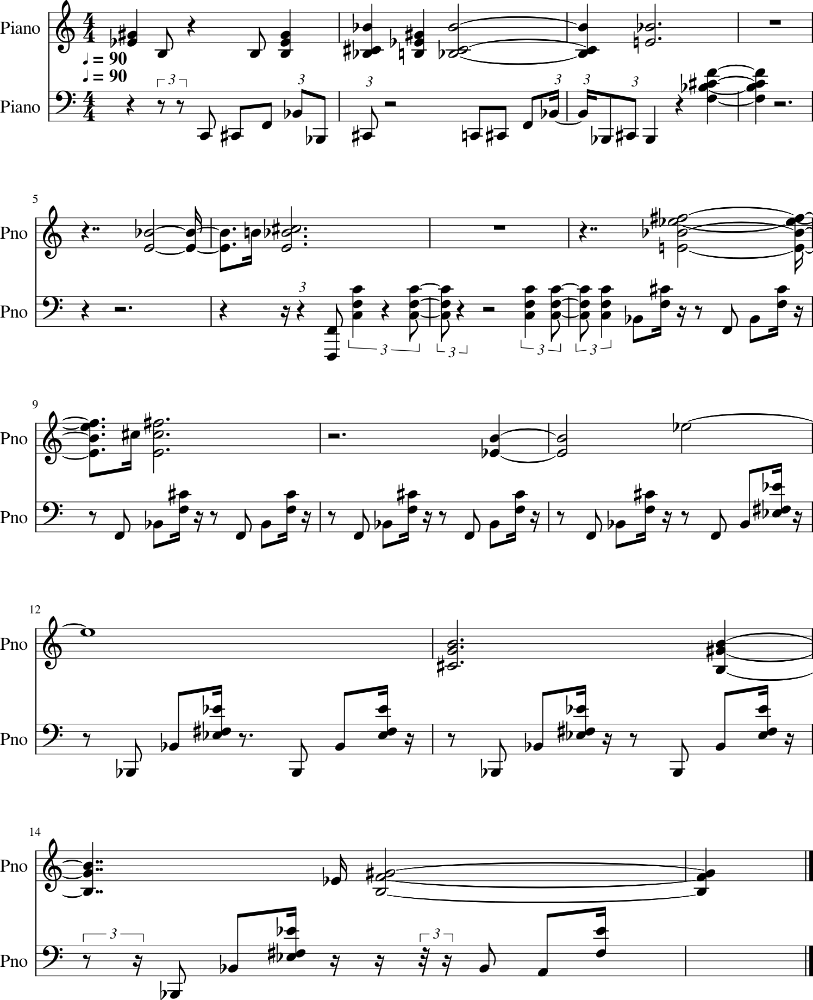

In [ ]:
music_generated_lm_1.show()

In [ ]:
play(music_generated_lm_1)

In [ ]:
files.download(download(music_generated_lm_1))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Music Generated (key:A Minor - tempo:60)

In [ ]:

seed_len = 100
num_note_to_gen = 100

# We get a random sequence from the input
seq_start_at = random.randint(0,len(treble_df['note_duration'])-sequence_length)
start_tokens = treble_df['note_duration'][seq_start_at:seq_start_at + seed_len].tolist()

original = start_tokens.copy()
backup = original.copy()

def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)


def sample_from(logits, k):
    logits, indices = tf.math.top_k(logits, k= k, sorted=True)
    indices = np.asarray(indices).astype("int32")
    preds = np.asarray(logits).astype("float32")
    preds = softmax(preds)
    return np.random.choice(indices, p=preds)


k = 10
tokens_generated_tr = []
num_tokens_generated = 0

while num_tokens_generated <= num_note_to_gen:
    x = start_tokens[-sequence_length:]
    pad_len = maxlen - len(start_tokens)
    sample_index = -1
    if pad_len > 0:
        x = start_tokens + [0] * pad_len
        sample_index = len(start_tokens) - 1

    x = np.array([x])
    y = lm_tr.predict(x)
    sample_token = sample_from(y[0][sample_index], 10)
    tokens_generated_tr.append(sample_token)
    start_tokens.append(sample_token)
    num_tokens_generated = len(tokens_generated_tr)
    print(f"generated {num_tokens_generated} notes")


1/1 [==============================] - 0s 27ms/step
generated 1 notes
1/1 [==============================] - 0s 24ms/step
generated 2 notes
1/1 [==============================] - 0s 26ms/step
generated 3 notes
1/1 [==============================] - 0s 28ms/step
generated 4 notes
1/1 [==============================] - 0s 23ms/step
generated 5 notes
1/1 [==============================] - 0s 25ms/step
generated 6 notes
1/1 [==============================] - 0s 26ms/step
generated 7 notes
1/1 [==============================] - 0s 29ms/step
generated 8 notes
1/1 [==============================] - 0s 24ms/step
generated 9 notes
1/1 [==============================] - 0s 27ms/step
generated 10 notes
1/1 [==============================] - 0s 23ms/step
generated 11 notes
1/1 [==============================] - 0s 24ms/step
generated 12 notes
1/1 [==============================] - 0s 30ms/step
generated 13 notes
1/1 [==============================] - 0s 25ms/step
generated 14 notes
1/1 [==========

In [ ]:
iv_togen_tr = label_encoder_tr.inverse_transform(tokens_generated_tr)

In [ ]:
pred_note_tr = []
pred_dur_tr = []

for i in iv_togen_tr:
  pred_note_tr.append(re.split('_', i)[0])
  pred_dur_tr.append(re.split('_', i)[1])


In [ ]:
generated_tr_lm = pd.DataFrame(list(zip(pred_note_tr, pred_dur_tr)), columns =['music_element', 'duration'])

In [ ]:

seed_len = 100
num_note_to_gen = 100

# We get a random sequence from the input
seq_start_at = random.randint(0,len(bass_df['note_duration'])-sequence_length)
start_tokens = bass_df['note_duration'][seq_start_at:seq_start_at + seed_len].tolist()

original = start_tokens.copy()
backup = original.copy()

def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)


def sample_from(logits, k):
    logits, indices = tf.math.top_k(logits, k= k, sorted=True)
    indices = np.asarray(indices).astype("int32")
    preds = np.asarray(logits).astype("float32")
    preds = softmax(preds)
    return np.random.choice(indices, p=preds)


k = 10
tokens_generated_bs = []
num_tokens_generated = 0

while num_tokens_generated <= num_note_to_gen:
    x = start_tokens[-sequence_length:]
    pad_len = maxlen - len(start_tokens)
    sample_index = -1
    if pad_len > 0:
        x = start_tokens + [0] * pad_len
        sample_index = len(start_tokens) - 1

    x = np.array([x])
    y = lm_bs.predict(x)
    sample_token = sample_from(y[0][sample_index], 10)
    tokens_generated_bs.append(sample_token)
    start_tokens.append(sample_token)
    num_tokens_generated = len(tokens_generated_bs)
    print(f"generated {num_tokens_generated} notes")


1/1 [==============================] - 0s 28ms/step
generated 1 notes
1/1 [==============================] - 0s 43ms/step
generated 2 notes
1/1 [==============================] - 0s 42ms/step
generated 3 notes
1/1 [==============================] - 0s 35ms/step
generated 4 notes
1/1 [==============================] - 0s 43ms/step
generated 5 notes
1/1 [==============================] - 0s 55ms/step
generated 6 notes
1/1 [==============================] - 0s 37ms/step
generated 7 notes
1/1 [==============================] - 0s 37ms/step
generated 8 notes
1/1 [==============================] - 0s 40ms/step
generated 9 notes
1/1 [==============================] - 0s 43ms/step
generated 10 notes
1/1 [==============================] - 0s 42ms/step
generated 11 notes
1/1 [==============================] - 0s 40ms/step
generated 12 notes
1/1 [==============================] - 0s 43ms/step
generated 13 notes
1/1 [==============================] - 0s 42ms/step
generated 14 notes
1/1 [==========

In [ ]:
iv_togen_bs = label_encoder_bs.inverse_transform(tokens_generated_bs)

In [ ]:
pred_note_bs = []
pred_dur_bs = []

for i in iv_togen_bs:
  pred_note_bs.append(re.split('_', i)[0])
  pred_dur_bs.append(re.split('_', i)[1])


In [ ]:
generated_bs_lm = pd.DataFrame(list(zip(pred_note_bs, pred_dur_bs)), columns =['music_element', 'duration'])

In [ ]:
for element_str, element_lst in chords_dict_tr.items():
  generated_tr_lm['music_element'] = generated_tr_lm['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_tr.items():
  generated_tr_lm['duration'] = generated_tr_lm['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
for element_str, element_lst in chords_dict_bs.items():
  generated_bs_lm['music_element'] = generated_bs_lm['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_bs.items():
  generated_bs_lm['duration'] = generated_bs_lm['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
main_stream = stream.Score(id='mainScore')
stream_part1 = stream.Part(id='Part1')
stream_part2 = stream.Part(id='Part2')
instrument1 = instrument.Piano()
clef1 = clef.TrebleClef()
clef2 = clef.BassClef()
tempos = tm2 = tempo.MetronomeMark(number=60)
keys = key.Key(pitch.Pitch('a'))
time_signature = meter.TimeSignature('4/4')
key_order = ['music_element', 'duration']

In [ ]:
def music_generation_part(stream_part, instrument, clef, tempo, key, time_signature, set_element):

  for i in [instrument, clef, tempo, key, time_signature]:
    stream_part.append(i)

  for notes, durations in zip(set_element[key_order[0]],set_element[key_order[1]]):
    note_name = None

    if type(notes) != list:

      if notes != 'rest':
        note_name = note.Note(notes)
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

      elif notes == 'rest':
        note_name = note.Rest()
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

    elif type(notes) == list:
      note_name = chord.Chord(notes)
      note_name.duration.quarterLength = durations
      stream_part.append(note_name)

  return stream_part

In [ ]:
treble_generation_part_lm = music_generation_part(stream_part1, instrument1, clef1, tempos, keys, time_signature, generated_tr_lm)

In [ ]:
bass_generation_part_lm = music_generation_part(stream_part2, instrument1, clef2, tempos, keys, time_signature, generated_bs_lm)

In [ ]:
def convert_to_float(frac_str):
    try:
        return float(frac_str)
    except ValueError:
        num, denom = frac_str.split('/')
        try:
            leading, num = num.split(' ')
            whole = float(leading)
        except ValueError:
            whole = 0
        frac = float(num) / float(denom)
        return whole - frac if whole < 0 else whole + frac

In [ ]:
for i in bass_generation_part_lm:
  if convert_to_float(i.offset) > convert_to_float(treble_generation_part_lm[-1].offset):
    bass_generation_part_lm.remove(i)

for i in treble_generation_part_lm:
  if convert_to_float(i.offset) > convert_to_float(bass_generation_part_lm[-1].offset):
    treble_generation_part_lm.remove(i)

In [ ]:
def music_generation_main(main_score, stream_parts_list):
  for i in stream_parts_list:
    main_score.insert(0, i)

  return main_score

In [ ]:
music_generated_lm_2 = music_generation_main(main_stream, [treble_generation_part_lm, bass_generation_part_lm])

In [ ]:
music_generated_lm_2.show('text')

{0.0} <music21.stream.Part Part1>
    {0.0} <music21.instrument.Piano 'Piano'>
    {0.0} <music21.clef.TrebleClef>
    {0.0} <music21.tempo.MetronomeMark larghetto Quarter=60>
    {0.0} <music21.key.Key of A major>
    {0.0} <music21.meter.TimeSignature 4/4>
    {0.0} <music21.note.Note C>
    {0.25} <music21.note.Note C#>
    {0.5} <music21.note.Note D>
    {0.75} <music21.note.Note F>
    {1.0} <music21.note.Note E->
    {1.25} <music21.note.Note C>
    {1.5} <music21.note.Note A>
    {1.75} <music21.note.Note F#>
    {2.0} <music21.note.Note E->
    {2.25} <music21.note.Note C#>
    {2.5} <music21.note.Note E->
    {2.75} <music21.note.Note F>
    {3.0} <music21.note.Note F#>
    {3.25} <music21.note.Note G#>
    {3.5} <music21.note.Note B->
    {3.75} <music21.note.Note B>
    {4.0} <music21.note.Note C>
    {4.25} <music21.note.Note C#>
    {4.5} <music21.note.Note C>
    {4.75} <music21.note.Note E->
    {5.0} <music21.note.Note C#>
    {5.25} <music21.note.Note B->
    {5.5} <mu

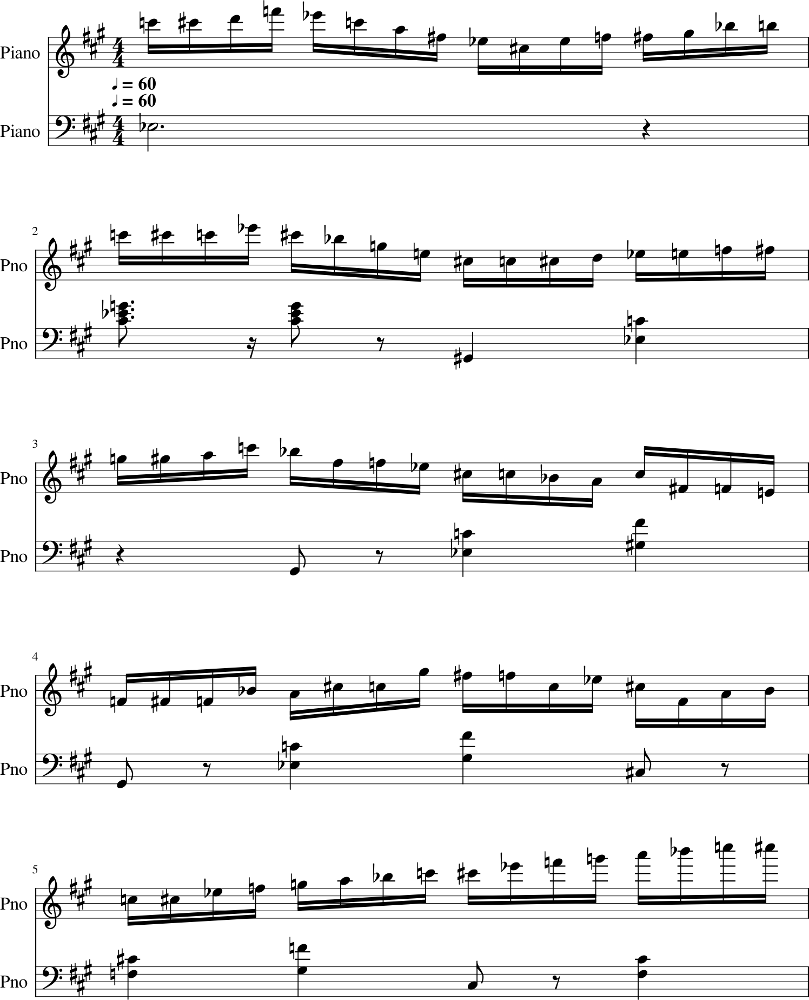

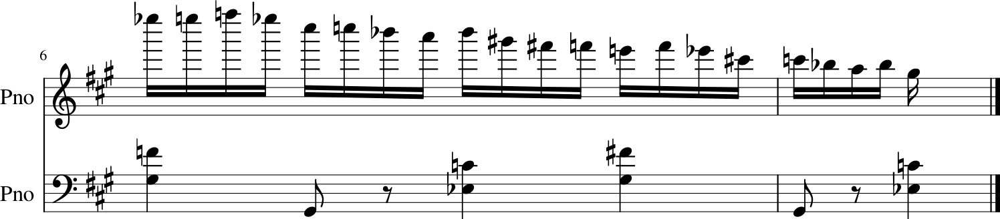

In [ ]:
music_generated_lm_2.show()

In [ ]:
play(music_generated_lm_2)

In [ ]:
files.download(download(music_generated_lm_2))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Music Generated (key:E Minor - tempo:120)

In [ ]:

seed_len = 100
num_note_to_gen = 100

# We get a random sequence from the input
seq_start_at = random.randint(0,len(treble_df['note_duration'])-sequence_length)
start_tokens = treble_df['note_duration'][seq_start_at:seq_start_at + seed_len].tolist()

original = start_tokens.copy()
backup = original.copy()

def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)


def sample_from(logits, k):
    logits, indices = tf.math.top_k(logits, k= k, sorted=True)
    indices = np.asarray(indices).astype("int32")
    preds = np.asarray(logits).astype("float32")
    preds = softmax(preds)
    return np.random.choice(indices, p=preds)


k = 10
tokens_generated_tr = []
num_tokens_generated = 0

while num_tokens_generated <= num_note_to_gen:
    x = start_tokens[-sequence_length:]
    pad_len = maxlen - len(start_tokens)
    sample_index = -1
    if pad_len > 0:
        x = start_tokens + [0] * pad_len
        sample_index = len(start_tokens) - 1

    x = np.array([x])
    y = lm_tr.predict(x)
    sample_token = sample_from(y[0][sample_index], 10)
    tokens_generated_tr.append(sample_token)
    start_tokens.append(sample_token)
    num_tokens_generated = len(tokens_generated_tr)
    print(f"generated {num_tokens_generated} notes")


1/1 [==============================] - 0s 28ms/step
generated 1 notes
1/1 [==============================] - 0s 24ms/step
generated 2 notes
1/1 [==============================] - 0s 24ms/step
generated 3 notes
1/1 [==============================] - 0s 24ms/step
generated 4 notes
1/1 [==============================] - 0s 24ms/step
generated 5 notes
1/1 [==============================] - 0s 25ms/step
generated 6 notes
1/1 [==============================] - 0s 24ms/step
generated 7 notes
1/1 [==============================] - 0s 27ms/step
generated 8 notes
1/1 [==============================] - 0s 23ms/step
generated 9 notes
1/1 [==============================] - 0s 23ms/step
generated 10 notes
1/1 [==============================] - 0s 23ms/step
generated 11 notes
1/1 [==============================] - 0s 23ms/step
generated 12 notes
1/1 [==============================] - 0s 24ms/step
generated 13 notes
1/1 [==============================] - 0s 26ms/step
generated 14 notes
1/1 [==========

In [ ]:
iv_togen_tr = label_encoder_tr.inverse_transform(tokens_generated_tr)

In [ ]:
pred_note_tr = []
pred_dur_tr = []

for i in iv_togen_tr:
  pred_note_tr.append(re.split('_', i)[0])
  pred_dur_tr.append(re.split('_', i)[1])


In [ ]:
generated_tr_lm = pd.DataFrame(list(zip(pred_note_tr, pred_dur_tr)), columns =['music_element', 'duration'])

In [ ]:

seed_len = 100
num_note_to_gen = 100

# We get a random sequence from the input
seq_start_at = random.randint(0,len(bass_df['note_duration'])-sequence_length)
start_tokens = bass_df['note_duration'][seq_start_at:seq_start_at + seed_len].tolist()

original = start_tokens.copy()
backup = original.copy()

def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)


def sample_from(logits, k):
    logits, indices = tf.math.top_k(logits, k= k, sorted=True)
    indices = np.asarray(indices).astype("int32")
    preds = np.asarray(logits).astype("float32")
    preds = softmax(preds)
    return np.random.choice(indices, p=preds)


k = 10
tokens_generated_bs = []
num_tokens_generated = 0

while num_tokens_generated <= num_note_to_gen:
    x = start_tokens[-sequence_length:]
    pad_len = maxlen - len(start_tokens)
    sample_index = -1
    if pad_len > 0:
        x = start_tokens + [0] * pad_len
        sample_index = len(start_tokens) - 1

    x = np.array([x])
    y = lm_bs.predict(x)
    sample_token = sample_from(y[0][sample_index], 10)
    tokens_generated_bs.append(sample_token)
    start_tokens.append(sample_token)
    num_tokens_generated = len(tokens_generated_bs)
    print(f"generated {num_tokens_generated} notes")


1/1 [==============================] - 0s 36ms/step
generated 1 notes
1/1 [==============================] - 0s 36ms/step
generated 2 notes
1/1 [==============================] - 0s 38ms/step
generated 3 notes
1/1 [==============================] - 0s 38ms/step
generated 4 notes
1/1 [==============================] - 0s 40ms/step
generated 5 notes
1/1 [==============================] - 0s 42ms/step
generated 6 notes
1/1 [==============================] - 0s 36ms/step
generated 7 notes
1/1 [==============================] - 0s 37ms/step
generated 8 notes
1/1 [==============================] - 0s 35ms/step
generated 9 notes
1/1 [==============================] - 0s 48ms/step
generated 10 notes
1/1 [==============================] - 0s 47ms/step
generated 11 notes
1/1 [==============================] - 0s 39ms/step
generated 12 notes
1/1 [==============================] - 0s 51ms/step
generated 13 notes
1/1 [==============================] - 0s 82ms/step
generated 14 notes
1/1 [==========

In [ ]:
iv_togen_bs = label_encoder_bs.inverse_transform(tokens_generated_bs)

In [ ]:
pred_note_bs = []
pred_dur_bs = []

for i in iv_togen_bs:
  pred_note_bs.append(re.split('_', i)[0])
  pred_dur_bs.append(re.split('_', i)[1])


In [ ]:
generated_bs_lm = pd.DataFrame(list(zip(pred_note_bs, pred_dur_bs)), columns =['music_element', 'duration'])

In [ ]:
for element_str, element_lst in chords_dict_tr.items():
  generated_tr_lm['music_element'] = generated_tr_lm['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_tr.items():
  generated_tr_lm['duration'] = generated_tr_lm['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
for element_str, element_lst in chords_dict_bs.items():
  generated_bs_lm['music_element'] = generated_bs_lm['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_bs.items():
  generated_bs_lm['duration'] = generated_bs_lm['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
main_stream = stream.Score(id='mainScore')
stream_part1 = stream.Part(id='Part1')
stream_part2 = stream.Part(id='Part2')
instrument1 = instrument.Piano()
clef1 = clef.TrebleClef()
clef2 = clef.BassClef()
tempos = tm2 = tempo.MetronomeMark(number=120)
keys = key.Key(pitch.Pitch('e'))
time_signature = meter.TimeSignature('4/4')
key_order = ['music_element', 'duration']

In [ ]:
def music_generation_part(stream_part, instrument, clef, tempo, key, time_signature, set_element):

  for i in [instrument, clef, tempo, key, time_signature]:
    stream_part.append(i)

  for notes, durations in zip(set_element[key_order[0]],set_element[key_order[1]]):
    note_name = None

    if type(notes) != list:

      if notes != 'rest':
        note_name = note.Note(notes)
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

      elif notes == 'rest':
        note_name = note.Rest()
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

    elif type(notes) == list:
      note_name = chord.Chord(notes)
      note_name.duration.quarterLength = durations
      stream_part.append(note_name)

  return stream_part

In [ ]:
treble_generation_part_lm = music_generation_part(stream_part1, instrument1, clef1, tempos, keys, time_signature, generated_tr_lm)

In [ ]:
bass_generation_part_lm = music_generation_part(stream_part2, instrument1, clef2, tempos, keys, time_signature, generated_bs_lm)

In [ ]:
def convert_to_float(frac_str):
    try:
        return float(frac_str)
    except ValueError:
        num, denom = frac_str.split('/')
        try:
            leading, num = num.split(' ')
            whole = float(leading)
        except ValueError:
            whole = 0
        frac = float(num) / float(denom)
        return whole - frac if whole < 0 else whole + frac

In [ ]:
for i in bass_generation_part_lm:
  if convert_to_float(i.offset) > convert_to_float(treble_generation_part_lm[-1].offset):
    bass_generation_part_lm.remove(i)

for i in treble_generation_part_lm:
  if convert_to_float(i.offset) > convert_to_float(bass_generation_part_lm[-1].offset):
    treble_generation_part_lm.remove(i)

In [ ]:
def music_generation_main(main_score, stream_parts_list):
  for i in stream_parts_list:
    main_score.insert(0, i)

  return main_score

In [ ]:
music_generated_lm_3 = music_generation_main(main_stream, [treble_generation_part_lm, bass_generation_part_lm])

In [ ]:
music_generated_lm_3.show('text')

{0.0} <music21.stream.Part Part1>
    {0.0} <music21.instrument.Piano 'Piano'>
    {0.0} <music21.clef.TrebleClef>
    {0.0} <music21.tempo.MetronomeMark animato Quarter=120>
    {0.0} <music21.key.Key of E major>
    {0.0} <music21.meter.TimeSignature 4/4>
    {0.0} <music21.note.Note B->
    {1.0} <music21.note.Note C#>
    {1.5} <music21.note.Note B>
    {2.0} <music21.note.Note B->
    {3.0} <music21.note.Note B>
    {3.5} <music21.note.Note G#>
    {4.75} <music21.note.Note B>
    {5.25} <music21.note.Note B>
    {5.75} <music21.note.Note C#>
    {6.25} <music21.note.Note B->
    {6.5} <music21.chord.Chord C#5 C#4>
    {7.0} <music21.note.Rest 16th>
    {7.25} <music21.note.Note B>
    {7.5} <music21.note.Note E->
    {8.0} <music21.note.Note B->
    {9.0} <music21.note.Note E->
    {9.5} <music21.note.Note G#>
    {10.75} <music21.note.Note E->
    {11.25} <music21.note.Note E->
    {11.75} <music21.note.Note C#>
    {12.25} <music21.note.Note B->
    {12.5} <music21.chord.Chord 

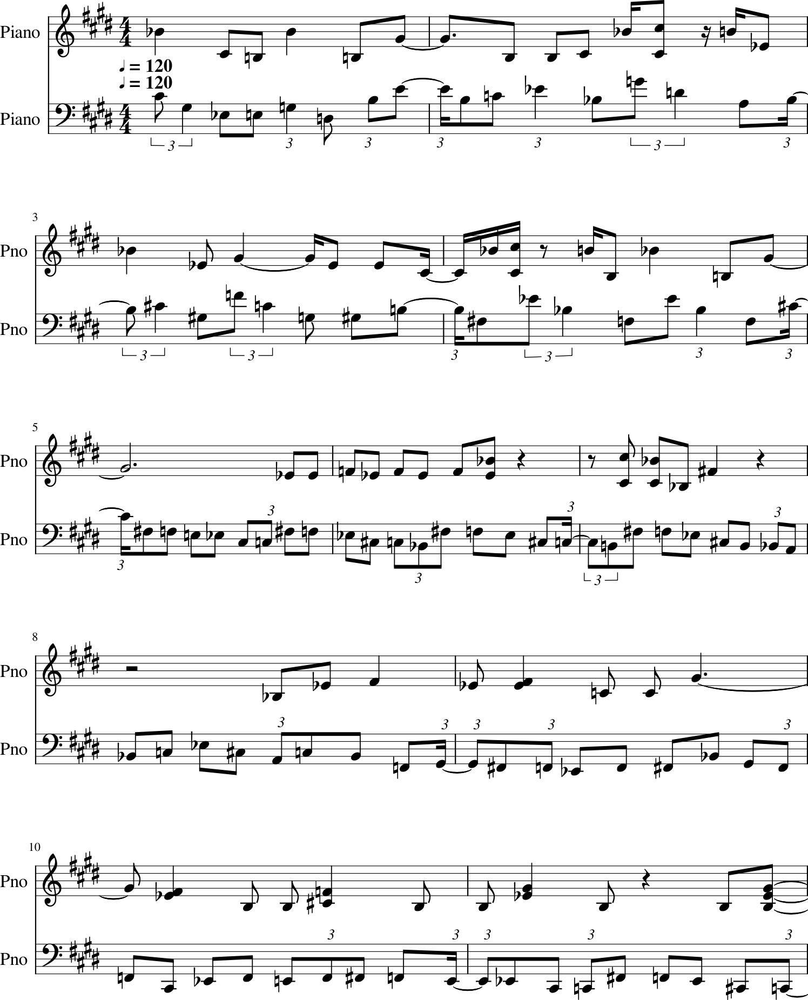

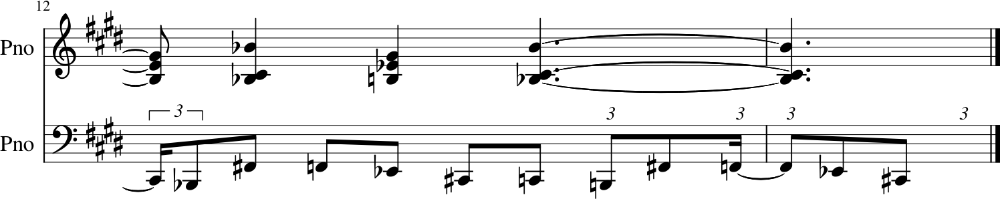

In [ ]:
music_generated_lm_3.show()

In [ ]:
play(music_generated_lm_3)

In [ ]:
files.download(download(music_generated_lm_3))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>